# 학생 성과 예측

[1] 모듈 로드

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz

[2] 데이터 준비

In [34]:
dataDF=pd.read_csv('student_performance_prediction.csv')
dataDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 7 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Student ID                                   40000 non-null  object 
 1   Study Hours per Week                         38005 non-null  float64
 2   Attendance Rate                              38008 non-null  float64
 3   Previous Grades                              38006 non-null  float64
 4   Participation in Extracurricular Activities  38000 non-null  object 
 5   Parent Education Level                       38000 non-null  object 
 6   Passed                                       38000 non-null  object 
dtypes: float64(3), object(4)
memory usage: 2.1+ MB


In [35]:
dataDF.head()

,Student ID,Study Hours per Week,Attendance Rate,Previous Grades,Participation in Extracurricular Activities,Parent Education Level,Passed
0,S00001,12.5,NaN,75.0,Yes,Master,Yes
1,S00002,9.3,95.3,60.6,No,High School,No
2,S00003,13.2,NaN,64.0,No,Associate,No
3,S00004,17.6,76.8,62.4,Yes,Bachelor,No
4,S00005,8.8,89.3,72.7,No,Master,No


In [36]:
dataDF.describe()

,Study Hours per Week,Attendance Rate,Previous Grades
count,38005.000000,38008.000000,38006.000000
mean,9.962744,75.276323,65.440107
std,5.031154,20.393418,16.503119
min,-12.300000,-14.300000,8.300000
25%,6.600000,61.600000,55.100000
50%,10.000000,75.300000,65.200000
75%,13.400000,88.800000,75.200000
max,32.400000,150.200000,200.000000


In [37]:
# 결측치 확인
dataDF.isna().sum()

Student ID                                        0
Study Hours per Week                           1995
Attendance Rate                                1992
Previous Grades                                1994
Participation in Extracurricular Activities    2000
Parent Education Level                         2000
Passed                                         2000
dtype: int64

[3] 데이터 전처리

In [38]:
# Study Hours per Week 값 Nan은 0으로 바꾸고, 양수만 남기기
values = {'Study Hours per Week':0}
dataDF.fillna(value=values,inplace=True)

dataDF = dataDF[dataDF['Study Hours per Week'] >= 0]
dataDF

,Student ID,Study Hours per Week,Attendance Rate,Previous Grades,Participation in Extracurricular Activities,Parent Education Level,Passed
0,S00001,12.5,NaN,75.0,Yes,Master,Yes
1,S00002,9.3,95.3,60.6,No,High School,No
2,S00003,13.2,NaN,64.0,No,Associate,No
3,S00004,17.6,76.8,62.4,Yes,Bachelor,No
4,S00005,8.8,89.3,72.7,No,Master,No
...,...,...,...,...,...,...,...
39995,S39996,15.6,93.8,51.4,Yes,Master,No
39996,S39997,11.3,66.4,64.2,No,Doctorate,Yes
39997,S39998,13.1,65.6,38.1,No,Bachelor,No
39998,S39999,14.1,74.9,NaN,Yes,Master,No


In [39]:
# Attendance Rate 데이터 음수값, 100 초과값 날리기
mask = (dataDF['Attendance Rate']>0) & (dataDF['Attendance Rate']<=100)
dataDF=dataDF[mask]
dataDF

,Student ID,Study Hours per Week,Attendance Rate,Previous Grades,Participation in Extracurricular Activities,Parent Education Level,Passed
1,S00002,9.3,95.3,60.6,No,High School,No
3,S00004,17.6,76.8,62.4,Yes,Bachelor,No
4,S00005,8.8,89.3,72.7,No,Master,No
5,S00006,8.8,73.8,69.3,Yes,High School,Yes
6,S00007,17.9,38.6,93.6,No,Doctorate,Yes
...,...,...,...,...,...,...,...
39995,S39996,15.6,93.8,51.4,Yes,Master,No
39996,S39997,11.3,66.4,64.2,No,Doctorate,Yes
39997,S39998,13.1,65.6,38.1,No,Bachelor,No
39998,S39999,14.1,74.9,NaN,Yes,Master,No


In [40]:
# Previous Grades => 100 초과값 날리기, Nan값 => 중앙값

# Participation in Extracurricular Activities => Nan값 -> no

# Parent Education Level => Nan값 => 중졸이하


mask = (dataDF['Previous Grades']<=100)
dataDF=dataDF[mask].copy()

values = {'Previous Grades':65.2,'Participation in Extracurricular Activities':'No','Parent Education Level':'Under_Middle'}
dataDF.fillna(value=values,inplace=True)

dataDF

,Student ID,Study Hours per Week,Attendance Rate,Previous Grades,Participation in Extracurricular Activities,Parent Education Level,Passed
1,S00002,9.3,95.3,60.6,No,High School,No
3,S00004,17.6,76.8,62.4,Yes,Bachelor,No
4,S00005,8.8,89.3,72.7,No,Master,No
5,S00006,8.8,73.8,69.3,Yes,High School,Yes
6,S00007,17.9,38.6,93.6,No,Doctorate,Yes
...,...,...,...,...,...,...,...
39994,S39995,5.1,92.1,46.1,Yes,Doctorate,No
39995,S39996,15.6,93.8,51.4,Yes,Master,No
39996,S39997,11.3,66.4,64.2,No,Doctorate,Yes
39997,S39998,13.1,65.6,38.1,No,Bachelor,No


In [41]:
#  passed 컬럼(target) 결측치 제거
dataDF=dataDF.dropna(subset=['Passed'], how='any', axis=0)
dataDF

,Student ID,Study Hours per Week,Attendance Rate,Previous Grades,Participation in Extracurricular Activities,Parent Education Level,Passed
1,S00002,9.3,95.3,60.6,No,High School,No
3,S00004,17.6,76.8,62.4,Yes,Bachelor,No
4,S00005,8.8,89.3,72.7,No,Master,No
5,S00006,8.8,73.8,69.3,Yes,High School,Yes
6,S00007,17.9,38.6,93.6,No,Doctorate,Yes
...,...,...,...,...,...,...,...
39994,S39995,5.1,92.1,46.1,Yes,Doctorate,No
39995,S39996,15.6,93.8,51.4,Yes,Master,No
39996,S39997,11.3,66.4,64.2,No,Doctorate,Yes
39997,S39998,13.1,65.6,38.1,No,Bachelor,No


In [42]:
dataDF.isna().sum()

Student ID                                     0
Study Hours per Week                           0
Attendance Rate                                0
Previous Grades                                0
Participation in Extracurricular Activities    0
Parent Education Level                         0
Passed                                         0
dtype: int64

In [43]:
dataDF.describe()

,Study Hours per Week,Attendance Rate,Previous Grades
count,29477.000000,29477.000000,29477.000000
mean,9.729386,70.990413,64.657872
std,5.113606,16.814976,14.488412
min,0.000000,0.500000,8.300000
25%,6.200000,59.800000,54.900000
50%,9.800000,72.400000,64.900000
75%,13.300000,84.000000,74.700000
max,32.400000,100.000000,100.000000


In [44]:
dataDF['Parent Education Level'].value_counts()

Parent Education Level
Bachelor        5674
Associate       5639
Doctorate       5630
High School     5602
Master          5478
Under_Middle    1454
Name: count, dtype: int64

In [45]:
dataDF['Participation in Extracurricular Activities'].value_counts()

Participation in Extracurricular Activities
No     15479
Yes    13998
Name: count, dtype: int64

In [46]:
dataDF=dataDF.drop('Student ID',axis=1)
dataDF

,Study Hours per Week,Attendance Rate,Previous Grades,Participation in Extracurricular Activities,Parent Education Level,Passed
1,9.3,95.3,60.6,No,High School,No
3,17.6,76.8,62.4,Yes,Bachelor,No
4,8.8,89.3,72.7,No,Master,No
5,8.8,73.8,69.3,Yes,High School,Yes
6,17.9,38.6,93.6,No,Doctorate,Yes
...,...,...,...,...,...,...
39994,5.1,92.1,46.1,Yes,Doctorate,No
39995,15.6,93.8,51.4,Yes,Master,No
39996,11.3,66.4,64.2,No,Doctorate,Yes
39997,13.1,65.6,38.1,No,Bachelor,No


In [47]:
# LabelEncoder 인스턴스 생성
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

In [48]:
# 데이터 인코딩
for c in dataDF.columns:
    dataDF[c] = encoder.fit_transform(dataDF[c])

dataDF.head()

,Study Hours per Week,Attendance Rate,Previous Grades,Participation in Extracurricular Activities,Parent Education Level,Passed
1,93,814,414,0,3,0
3,176,629,432,1,1,0
4,88,754,535,0,4,0
5,88,599,501,1,3,1
6,179,247,744,0,2,1


In [49]:
for c in dataDF.columns:
    print(f'{c} : {dataDF[c].unique()}')


Study Hours per Week : [ 93 176  88 179 138  77   4  14  72  49 116  55  29  89 103  73 119  70
  85 193  99  47 141  39 110   2  34   0 109  26  64 153 117  81  66 147
 149  76  91  45  40 168  96 150 118 177  98 178 104 105   1  60  75 146
  74 126  65  84 115 100  79  92 120 194 223  90  42 157 140 170 210  22
 124  54  61  38 111 165  20 113 139 112  51 158 121  62  56 114 101 173
  87 131  57  24 108 128 154  31  53 133 216 134  19  46 102  67 207 143
  94 125  83 188  37 206 152 163 122  97 182  28  78 107 172 123 106 129
  69  71 142 145 137 164 127 155 130  59 205  30 174  50  86  95 135 208
 144 209  58 192 159 136  44  23  63  52  12  15  35  48 253 156  68 184
  10 132  80   6 214 175 222 167 180 183  25 229 162  82  36 185  33 151
   8  32 228 189 191  21 215 171 201 190 226 169 160 166 204 187 186  17
  27  13 196  43 181 148 213  41 211 161 203 230 258 195  16 198 232  11
 256   5 238 221  18   7 200 254 218 249 199 235 268   9 243 197 202 224
 257 241   3 227 217 220 255

In [50]:
dataDF.corr()

,Study Hours per Week,Attendance Rate,Previous Grades,Participation in Extracurricular Activities,Parent Education Level,Passed
Study Hours per Week,1.000000,0.002646,0.003902,0.002568,-0.004232,-0.011418
Attendance Rate,0.002646,1.000000,-0.003540,0.004896,0.001213,0.002356
Previous Grades,0.003902,-0.003540,1.000000,-0.000615,-0.004693,-0.004033
Participation in Extracurricular Activities,0.002568,0.004896,-0.000615,1.000000,-0.000371,0.002266
Parent Education Level,-0.004232,0.001213,-0.004693,-0.000371,1.000000,0.004521
Passed,-0.011418,0.002356,-0.004033,0.002266,0.004521,1.000000


In [51]:
def draw_bar(df):
    col = 3
    row = (len(df.columns) + col - 1) // col
    colors = [
    "#AED6F1",  # 옅은 하늘색
    "#A9DFBF",  # 옅은 초록색
    "#F9E79F",  # 옅은 노란색
    "#F5B7B1",  # 옅은 핑크색
    "#D2B4DE",  # 옅은 보라색
    "#FAD7A0",  # 옅은 주황색
    "#D5DBDB",  # 옅은 회색
    "#A3E4D7",  # 옅은 민트색
    "#D7BDE2",  # 옅은 연보라색
    "#F5CBA7",  # 옅은 살구색
]

    plt.figure(figsize=(15, row * 4))
    for i, column in enumerate(df.columns, 1):
        plt.subplot(row, col, i)
        df[column].value_counts().plot(kind='bar', color=colors)
        plt.title(column)
        plt.xticks(rotation=360)
    plt.tight_layout()
    plt.show()

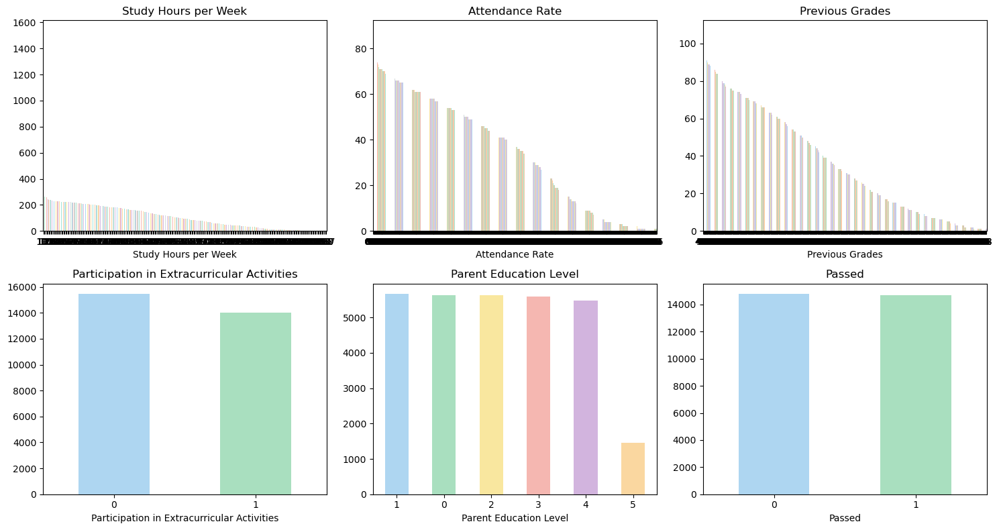

In [52]:
draw_bar(dataDF)

## DecisionTree

- target, feature 분리

In [53]:
featureDF=dataDF[dataDF.columns[:-1]]
targetSR=dataDF[dataDF.columns[-1:]]

In [54]:
featureDF.head()

,Study Hours per Week,Attendance Rate,Previous Grades,Participation in Extracurricular Activities,Parent Education Level
1,93,814,414,0,3
3,176,629,432,1,1
4,88,754,535,0,4
5,88,599,501,1,3
6,179,247,744,0,2


In [55]:
targetSR.head()

,Passed
1,0
3,0
4,0
5,1
6,1


- 학습과 테스트 데이터 세트로 분리

In [56]:
X_train, X_test, y_train, y_test = train_test_split(featureDF,
                                                    targetSR,
                                                    random_state=777)

- DecisionTree Classifier생성

In [57]:
dt_clf=DecisionTreeClassifier(max_depth=20,random_state=777)

- 학습 

In [58]:
dt_clf.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=20, random_state=777)

In [59]:
# export_graphiz()의 호출 결과로 out_file로 지정된 tree.dot 파일을 생성함.
export_graphviz(dt_clf,out_file='Student_tree.dot', 
                class_names=['0','1'],
                feature_names=featureDF.columns,
                impurity=True,filled=True)

In [60]:
import graphviz

with open('Student_tree.dot') as f:
    dot_graph=f.read()
graphviz.Source(dot_graph)

In [61]:
dt_clf.score(X_test,y_test)

0.5063772048846675

In [62]:
parameters={'max_depth':[10,15,20,25,30],'min_samples_split':[2,3,4,5]}

In [64]:
from sklearn.model_selection import GridSearchCV
grid_dtree=GridSearchCV(dt_clf,param_grid=parameters,cv=5,refit=True)

In [65]:
grid_dtree.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(max_depth=20, random_state=777),
             param_grid={'max_depth': [10, 15, 20, 25, 30],
                         'min_samples_split': [2, 3, 4, 5]})

In [66]:
dataDF2=pd.DataFrame(grid_dtree.cv_results_)
dataDF2[['params','mean_test_score','rank_test_score','split0_test_score','split1_test_score','split2_test_score']]

,params,mean_test_score,rank_test_score,split0_test_score,split1_test_score,split2_test_score
0,"{'max_depth': 10, 'min_samples_split': 2}",0.502691,12,0.510403,0.498869,0.503054
1,"{'max_depth': 10, 'min_samples_split': 3}",0.502827,11,0.510403,0.499095,0.501696
2,"{'max_depth': 10, 'min_samples_split': 4}",0.503641,9,0.510855,0.500226,0.503506
3,"{'max_depth': 10, 'min_samples_split': 5}",0.503234,10,0.510629,0.499322,0.503280
4,"{'max_depth': 15, 'min_samples_split': 2}",0.506266,6,0.505201,0.490954,0.505994
5,"{'max_depth': 15, 'min_samples_split': 3}",0.506447,5,0.506106,0.488467,0.505768
6,"{'max_depth': 15, 'min_samples_split': 4}",0.506537,4,0.505654,0.492537,0.504637
7,"{'max_depth': 15, 'min_samples_split': 5}",0.505813,8,0.504749,0.492763,0.503958
8,"{'max_depth': 20, 'min_samples_split': 2}",0.506853,2,0.514021,0.493894,0.501018
9,"{'max_depth': 20, 'min_samples_split': 3}",0.506582,3,0.513795,0.494799,0.504185


In [67]:
# 가장 좋은 모델
best_model = grid_dtree.best_estimator_
print(f'best_model.max_depth: {best_model.max_depth}')
print(f'best_model.min_samples_leaf: {best_model.min_samples_leaf}')

best_model.max_depth: 20
best_model.min_samples_leaf: 1


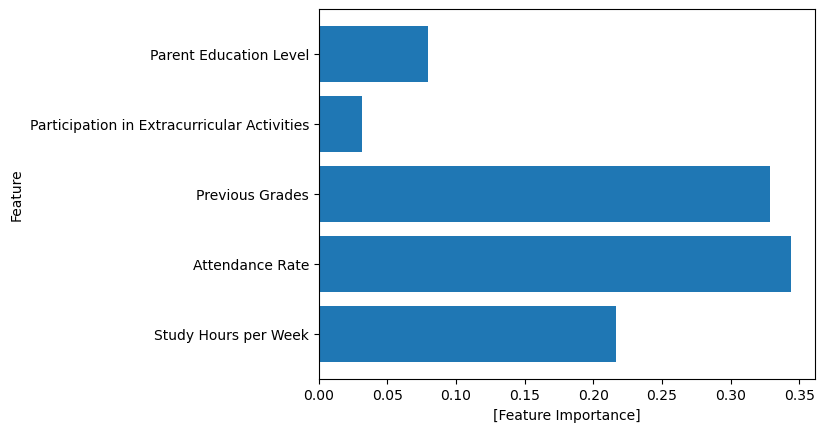

In [68]:

plt.barh(range(best_model.n_features_in_), best_model.feature_importances_, align='center')
plt.yticks(np.arange(best_model.n_features_in_), best_model.feature_names_in_)
plt.xlabel('[Feature Importance]')
plt.ylabel('Feature')
plt.show()

In [71]:
# GridSearchCV에서 최적의 결정 트리 모델 추출
best_dtree = grid_dtree.best_estimator_

# 결정 트리 시각화
export_graphviz(best_dtree, 
                out_file='Student_tree2.dot', 
                class_names=['0', '1'],
                feature_names=featureDF.columns,
                impurity=True, 
                filled=True)

In [72]:
# 생성된 dot 파일을 읽어 시각화
with open('Student_tree2.dot') as f:
    dot_graph = f.read()
    
graphviz.Source(dot_graph)

In [102]:
parameters2={'max_depth':[5,6,7,8,9,10],'min_samples_split':[2,3,4,5,6,7,8,9]}
grid_dtree2=GridSearchCV(dt_clf,param_grid=parameters2,cv=20,refit=True)
grid_dtree2.fit(X_train,y_train)

dataDF3=pd.DataFrame(grid_dtree2.cv_results_)
dataDF3[['params','mean_test_score','rank_test_score','split0_test_score','split1_test_score','split2_test_score']]



,params,mean_test_score,rank_test_score,split0_test_score,split1_test_score,split2_test_score
0,"{'max_depth': 5, 'min_samples_split': 2}",0.506899,33,0.510850,0.493671,0.500904
1,"{'max_depth': 5, 'min_samples_split': 3}",0.506899,33,0.510850,0.493671,0.500904
2,"{'max_depth': 5, 'min_samples_split': 4}",0.506853,35,0.510850,0.493671,0.500904
3,"{'max_depth': 5, 'min_samples_split': 5}",0.506808,36,0.510850,0.493671,0.500904
4,"{'max_depth': 5, 'min_samples_split': 6}",0.506808,36,0.510850,0.493671,0.500904
5,"{'max_depth': 5, 'min_samples_split': 7}",0.506808,36,0.510850,0.493671,0.500904
6,"{'max_depth': 5, 'min_samples_split': 8}",0.506808,36,0.510850,0.493671,0.500904
7,"{'max_depth': 5, 'min_samples_split': 9}",0.506808,36,0.510850,0.493671,0.500904
8,"{'max_depth': 6, 'min_samples_split': 2}",0.506582,44,0.500904,0.514467,0.504521
9,"{'max_depth': 6, 'min_samples_split': 3}",0.506582,44,0.500904,0.514467,0.504521


best_model.max_depth: 9
best_model.min_samples_leaf: 1


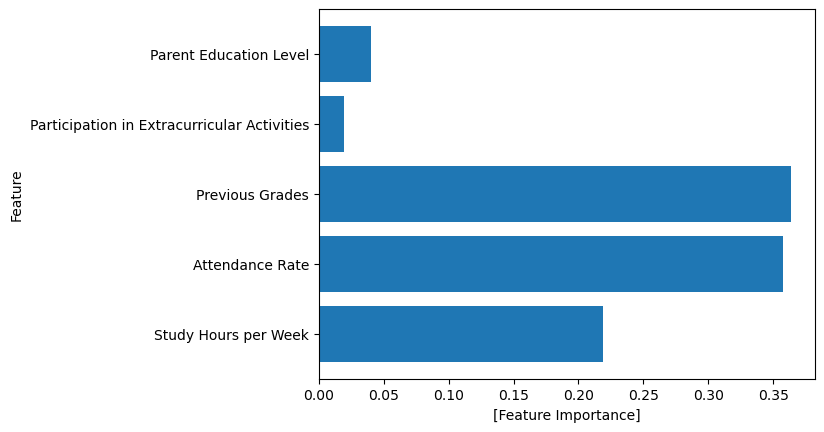

In [103]:
# 가장 좋은 모델
best_model = grid_dtree2.best_estimator_
print(f'best_model.max_depth: {best_model.max_depth}')
print(f'best_model.min_samples_leaf: {best_model.min_samples_leaf}')


plt.barh(range(best_model.n_features_in_), best_model.feature_importances_, align='center')
plt.yticks(np.arange(best_model.n_features_in_), best_model.feature_names_in_)
plt.xlabel('[Feature Importance]')
plt.ylabel('Feature')
plt.show()


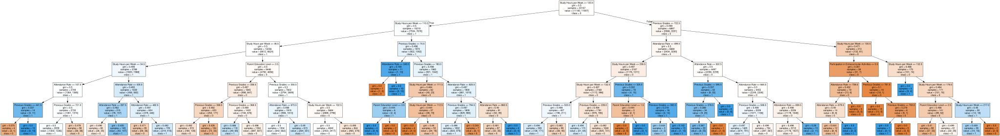

In [100]:
# GridSearchCV에서 최적의 결정 트리 모델 추출
best_dtree3 = grid_dtree2.best_estimator_

# 결정 트리 시각화
export_graphviz(best_dtree3, 
                out_file='Student_tree2.dot', 
                class_names=['0', '1'],
                feature_names=featureDF.columns,
                impurity=True, 
                filled=True)


# 생성된 dot 파일을 읽어 시각화
with open('Student_tree2.dot') as f:
    dot_graph = f.read()
    
graphviz.Source(dot_graph)

In [101]:
from sklearn.metrics import confusion_matrix
pred = best_dtree3.predict(X_test)
confusion = confusion_matrix(pred, y_test)
confusion

array([[2104, 2124],
       [1597, 1545]], dtype=int64)

In [105]:
parameters2={'max_depth':[5,6,7,8,9,10],'max_leaf_nodes':[10],'min_samples_split':[2,3,4,5,6,7,8,9]}
grid_dtree2=GridSearchCV(dt_clf,param_grid=parameters2,cv=20,refit=True)
grid_dtree2.fit(X_train,y_train)

dataDF3=pd.DataFrame(grid_dtree2.cv_results_)
dataDF3[['params','mean_test_score','rank_test_score','split0_test_score','split1_test_score','split2_test_score']]

,params,mean_test_score,rank_test_score,split0_test_score,split1_test_score,split2_test_score
0,"{'max_depth': 5, 'max_leaf_nodes': 10, 'min_sa...",0.502645,41,0.513562,0.519892,0.492767
1,"{'max_depth': 5, 'max_leaf_nodes': 10, 'min_sa...",0.502645,41,0.513562,0.519892,0.492767
2,"{'max_depth': 5, 'max_leaf_nodes': 10, 'min_sa...",0.502645,41,0.513562,0.519892,0.492767
3,"{'max_depth': 5, 'max_leaf_nodes': 10, 'min_sa...",0.502645,41,0.513562,0.519892,0.492767
4,"{'max_depth': 5, 'max_leaf_nodes': 10, 'min_sa...",0.502645,41,0.513562,0.519892,0.492767
5,"{'max_depth': 5, 'max_leaf_nodes': 10, 'min_sa...",0.502645,41,0.513562,0.519892,0.492767
6,"{'max_depth': 5, 'max_leaf_nodes': 10, 'min_sa...",0.502645,41,0.513562,0.519892,0.492767
7,"{'max_depth': 5, 'max_leaf_nodes': 10, 'min_sa...",0.502645,41,0.513562,0.519892,0.492767
8,"{'max_depth': 6, 'max_leaf_nodes': 10, 'min_sa...",0.503324,33,0.500904,0.525316,0.503617
9,"{'max_depth': 6, 'max_leaf_nodes': 10, 'min_sa...",0.503324,33,0.500904,0.525316,0.503617


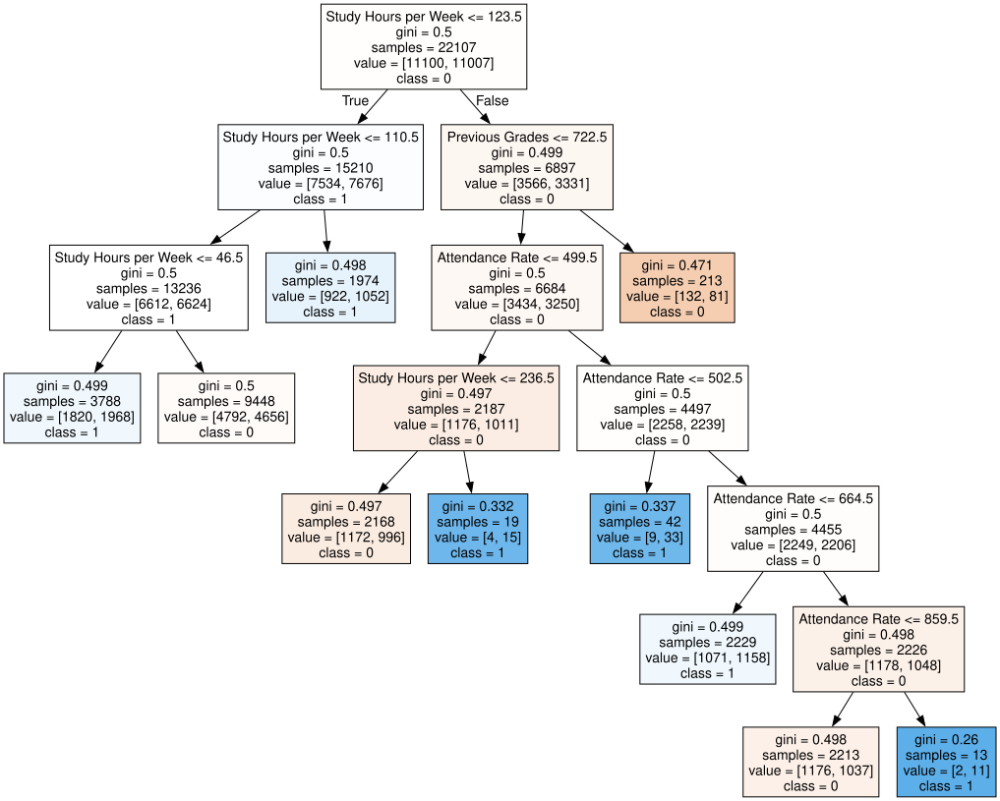

In [106]:
# GridSearchCV에서 최적의 결정 트리 모델 추출
best_dtree3 = grid_dtree2.best_estimator_

# 결정 트리 시각화
export_graphviz(best_dtree3, 
                out_file='Student_tree2.dot', 
                class_names=['0', '1'],
                feature_names=featureDF.columns,
                impurity=True, 
                filled=True)


# 생성된 dot 파일을 읽어 시각화
with open('Student_tree2.dot') as f:
    dot_graph = f.read()
    
graphviz.Source(dot_graph)

In [107]:
pred = best_dtree3.predict(X_test)
confusion = confusion_matrix(pred, y_test)
confusion

array([[2336, 2364],
       [1365, 1305]], dtype=int64)

In [108]:
parameters2={'max_depth':[20,25,30,35,40,45],'max_leaf_nodes':[10],'min_samples_split':[2,3,4,5,6,7,8,9]}
grid_dtree2=GridSearchCV(dt_clf,param_grid=parameters2,cv=20,refit=True)
grid_dtree2.fit(X_train,y_train)

dataDF3=pd.DataFrame(grid_dtree2.cv_results_)
dataDF3[['params','mean_test_score','rank_test_score','split0_test_score','split1_test_score','split2_test_score']]

,params,mean_test_score,rank_test_score,split0_test_score,split1_test_score,split2_test_score
0,"{'max_depth': 20, 'max_leaf_nodes': 10, 'min_s...",0.503776,1,0.499096,0.525316,0.498192
1,"{'max_depth': 20, 'max_leaf_nodes': 10, 'min_s...",0.503776,1,0.499096,0.525316,0.498192
2,"{'max_depth': 20, 'max_leaf_nodes': 10, 'min_s...",0.503776,1,0.499096,0.525316,0.498192
3,"{'max_depth': 20, 'max_leaf_nodes': 10, 'min_s...",0.503776,1,0.499096,0.525316,0.498192
4,"{'max_depth': 20, 'max_leaf_nodes': 10, 'min_s...",0.503776,1,0.499096,0.525316,0.498192
5,"{'max_depth': 20, 'max_leaf_nodes': 10, 'min_s...",0.503776,1,0.499096,0.525316,0.498192
6,"{'max_depth': 20, 'max_leaf_nodes': 10, 'min_s...",0.503776,1,0.499096,0.525316,0.498192
7,"{'max_depth': 20, 'max_leaf_nodes': 10, 'min_s...",0.503776,1,0.499096,0.525316,0.498192
8,"{'max_depth': 25, 'max_leaf_nodes': 10, 'min_s...",0.503776,1,0.499096,0.525316,0.498192
9,"{'max_depth': 25, 'max_leaf_nodes': 10, 'min_s...",0.503776,1,0.499096,0.525316,0.498192


In [109]:
parameters2={'max_depth':[20,25,30,35,40,45],'min_samples_split':[2,3,4,5,6,7,8,9]}
grid_dtree2=GridSearchCV(dt_clf,param_grid=parameters2,cv=20,refit=True)
grid_dtree2.fit(X_train,y_train)

dataDF3=pd.DataFrame(grid_dtree2.cv_results_)
dataDF3[['params','mean_test_score','rank_test_score','split0_test_score','split1_test_score','split2_test_score']]

,params,mean_test_score,rank_test_score,split0_test_score,split1_test_score,split2_test_score
0,"{'max_depth': 20, 'min_samples_split': 2}",0.500155,24,0.532550,0.532550,0.514467
1,"{'max_depth': 20, 'min_samples_split': 3}",0.500744,12,0.517179,0.540687,0.515371
2,"{'max_depth': 20, 'min_samples_split': 4}",0.499522,29,0.520796,0.533454,0.517179
3,"{'max_depth': 20, 'min_samples_split': 5}",0.500699,14,0.513562,0.530741,0.516275
4,"{'max_depth': 20, 'min_samples_split': 6}",0.500473,17,0.516275,0.528029,0.513562
5,"{'max_depth': 20, 'min_samples_split': 7}",0.501287,8,0.520796,0.530741,0.507233
6,"{'max_depth': 20, 'min_samples_split': 8}",0.501242,9,0.517179,0.530741,0.509042
7,"{'max_depth': 20, 'min_samples_split': 9}",0.502373,2,0.517179,0.528029,0.507233
8,"{'max_depth': 25, 'min_samples_split': 2}",0.498890,34,0.517179,0.530741,0.492767
9,"{'max_depth': 25, 'min_samples_split': 3}",0.499434,31,0.511754,0.520796,0.497288
